In [1]:
%%capture

!pip install mahotas

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import os
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from skimage import feature, filters
from scipy import ndimage as ndi
import mahotas as mt

In [3]:


# Function to load an image
def load_image(image_path, img_size=(224, 224)):
    """Loads and resizes an image."""
    if os.path.exists(image_path):
        img = cv2.imread(image_path)
        if img is None:
            raise ValueError(f"Could not read image at {image_path}")
        img_resized = cv2.resize(img, img_size)
        return img_resized
    else:
        raise FileNotFoundError(f"Image file not found: {image_path}")

# KEYPOINT-BASED METHODS

def extract_sift_features(image):
    """Extract SIFT features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_kaze_features(image):
    """Extract KAZE features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    kaze = cv2.KAZE_create()
    keypoints, descriptors = kaze.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_orb_features(image):
    """Extract ORB features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    orb = cv2.ORB_create()
    keypoints, descriptors = orb.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_akaze_features(image):
    """Extract AKAZE features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    akaze = cv2.AKAZE_create()
    keypoints, descriptors = akaze.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_brisk_features(image):
    """Extract BRISK features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    brisk = cv2.BRISK_create()
    keypoints, descriptors = brisk.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_fast_features(image):
    """Extract FAST corner features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    fast = cv2.FastFeatureDetector_create()
    keypoints = fast.detect(gray, None)
    return keypoints, None

# REGION-BASED METHODS

def visualize_hog(image):
    """Visualize HOG features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate HOG
    fd, hog_image = feature.hog(
        gray,
        orientations=8,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        visualize=True,
        feature_vector=True
    )

    # Rescale histogram for better visualization
    hog_image_rescaled = exposure_safe(hog_image)

    return hog_image_rescaled

def visualize_lbp(image):
    """Visualize LBP features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    radius = 3
    n_points = 8 * radius

    lbp = feature.local_binary_pattern(gray, n_points, radius, method='uniform')

    # Normalize for better visualization
    lbp_normalized = (lbp - lbp.min()) / (lbp.max() - lbp.min())

    return lbp_normalized

def visualize_gabor(image):
    """Visualize Gabor filter responses."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Generate Gabor kernel
    gabor_kernel = filters.gabor_kernel(frequency=0.6, theta=np.pi/4)

    # Apply filter
    filtered_real = ndi.convolve(gray, np.real(gabor_kernel), mode='wrap')

    # Normalize for visualization
    filtered_real = (filtered_real - filtered_real.min()) / (filtered_real.max() - filtered_real.min())

    return filtered_real

def visualize_color_histogram(image):
    """Visualize color histogram as a 3-channel image."""
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create a blank canvas
    hist_image = np.zeros((300, 300, 3), dtype=np.uint8)

    # Draw histograms
    for i, color in enumerate([(0, 0, 255), (0, 255, 0), (255, 0, 0)]):  # BGR
        # Calculate histogram
        hist = cv2.calcHist([hsv], [i], None, [256], [0, 256])
        hist = cv2.normalize(hist, hist, 0, 255, cv2.NORM_MINMAX)

        # Draw
        for j in range(256):
            cv2.line(hist_image, (j, 300), (j, 300 - int(hist[j])), color, 1)

    return hist_image

def visualize_shape_features(image):
    """Visualize shape features extraction."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Threshold the image
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a visualization image
    vis_img = np.zeros_like(image)

    if contours:
        # Get the largest contour
        largest_contour = max(contours, key=cv2.contourArea)

        # Draw the contour
        cv2.drawContours(vis_img, [largest_contour], 0, (0, 255, 0), 2)

        # If there are enough points, fit an ellipse
        if len(largest_contour) >= 5:
            ellipse = cv2.fitEllipse(largest_contour)
            cv2.ellipse(vis_img, ellipse, (0, 0, 255), 2)

    return vis_img

# PLANT-SPECIFIC METHODS

def visualize_vein_features(image):
    """Visualize vein extraction features."""
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE for better contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)

    # Edge detection for veins
    edges = cv2.Canny(enhanced, 50, 150)

    # Apply morphological operations
    kernel = np.ones((2, 2), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=1)

    # Create a colored visualization
    vis_img = cv2.cvtColor(dilated, cv2.COLOR_GRAY2BGR)

    # Detect lines (veins)
    lines = cv2.HoughLinesP(dilated, 1, np.pi/180, 50, minLineLength=10, maxLineGap=10)

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(vis_img, (x1, y1), (x2, y2), (0, 0, 255), 1)

    return vis_img

def visualize_leaf_color_features(image):
    """Visualize leaf color segmentation."""
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create masks for green regions
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([100, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    # Apply mask to original image
    green_only = cv2.bitwise_and(image, image, mask=green_mask)

    return green_only

def visualize_texture_wavelet(image):
    """Visualize wavelet decomposition."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Compute wavelet coefficients
    WTH, WTV, WTD = mt.wavelets.haar(gray, 1)

    # Normalize for visualization
    WTH_norm = normalize_array(WTH)
    WTV_norm = normalize_array(WTV)
    WTD_norm = normalize_array(WTD)

    # Create a composite image
    h, w = WTH.shape
    composite = np.zeros((h*2, w*2), dtype=np.float32)
    composite[:h, :w] = normalize_array(gray)[:h, :w]
    composite[:h, w:] = WTH_norm
    composite[h:, :w] = WTV_norm
    composite[h:, w:] = WTD_norm

    return composite

# DEEP LEARNING METHODS

def visualize_deep_features(image, model_name="resnet18"):
    """Visualize activation maps from a deep learning model."""
    # Convert to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pil_image = Image.fromarray(image_rgb)

    # Prepare image for model
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    img_tensor = preprocess(pil_image)
    img_tensor = img_tensor.unsqueeze(0)  # Add batch dimension

    # Load model
    if model_name == "resnet18":
        model = models.resnet18(pretrained=True)
        target_layer = model.layer4[-1]
    elif model_name == "vgg16":
        model = models.vgg16(pretrained=True)
        target_layer = model.features[-1]
    else:  # Default to resnet
        model = models.resnet18(pretrained=True)
        target_layer = model.layer4[-1]

    model.eval()

    # Extract intermediate activations
    activations = []

    def hook_fn(module, input, output):
        activations.append(output.detach())

    handle = target_layer.register_forward_hook(hook_fn)

    with torch.no_grad():
        model(img_tensor)

    handle.remove()

    # Get activation map
    activation = activations[0].squeeze()

    # Average across channels for visualization
    if len(activation.shape) == 3:
        activation_map = torch.mean(activation, dim=0).numpy()
    else:
        activation_map = activation.numpy()

    # Normalize and resize
    activation_map = normalize_array(activation_map)
    activation_map = cv2.resize(activation_map, (image.shape[1], image.shape[0]))

    # Apply colormap for better visualization
    heatmap = cv2.applyColorMap((activation_map * 255).astype(np.uint8), cv2.COLORMAP_JET)

    # Overlay on original image
    alpha = 0.6
    overlay = cv2.addWeighted(image, alpha, heatmap, 1-alpha, 0)

    return overlay

# HELPER FUNCTIONS

def exposure_safe(image):
    """Safe version of skimage.exposure.rescale_intensity."""
    img_min, img_max = image.min(), image.max()
    if img_max > img_min:
        return (image - img_min) / (img_max - img_min)
    return np.zeros_like(image)

def normalize_array(arr):
    """Normalize array values to 0-1 range."""
    arr_min, arr_max = arr.min(), arr.max()
    if arr_max > arr_min:
        return (arr - arr_min) / (arr_max - arr_min)
    return np.zeros_like(arr)

def draw_keypoints(image, keypoints, color=(0, 255, 0)):
    """Draw keypoints on an image."""
    img_with_kp = cv2.drawKeypoints(image, keypoints, None, color=color)
    return img_with_kp

# MAIN VISUALIZATION FUNCTION

def visualize_all_features(image_path, output_path=None):
    """Visualize all feature extraction methods on one image."""
    # Load the image
    try:
        image = load_image(image_path)
        print(f"Image loaded successfully: {image_path}")
    except Exception as e:
        print(f"Error loading image: {e}")
        return

    # Create figure
    plt.figure(figsize=(20, 24))
    gs = GridSpec(7, 3, figure=plt.gcf())

    # Original image
    ax = plt.subplot(gs[0, 0])
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_title("Original Image")
    ax.axis('off')

    # KEYPOINT METHODS
    keypoint_methods = [
        ("SIFT", extract_sift_features, (0, 0, 255)),
        ("KAZE", extract_kaze_features, (255, 0, 0)),
        ("ORB", extract_orb_features, (0, 255, 0)),
        ("AKAZE", extract_akaze_features, (255, 0, 255)),
        ("BRISK", extract_brisk_features, (0, 255, 255)),
        ("FAST", extract_fast_features, (255, 255, 0))
    ]

    # Process keypoint methods
    for i, (name, method, color) in enumerate(keypoint_methods):
        try:
            row, col = (i // 3) + 1, i % 3
            keypoints, _ = method(image)

            if keypoints is not None:
                img_with_kp = draw_keypoints(image, keypoints, color=color)

                ax = plt.subplot(gs[row, col])
                ax.imshow(cv2.cvtColor(img_with_kp, cv2.COLOR_BGR2RGB))
                ax.set_title(f"{name} ({len(keypoints)} keypoints)")
                ax.axis('off')
            else:
                print(f"No keypoints detected for {name}")
        except Exception as e:
            print(f"Error processing {name}: {e}")

    # REGION-BASED METHODS
    region_methods = [
        ("HOG", visualize_hog, 'gray'),
        ("LBP", visualize_lbp, 'gray'),
        ("Gabor Filter", visualize_gabor, 'gray'),
        ("Color Histogram", visualize_color_histogram, None),
        ("Shape Features", visualize_shape_features, None)
    ]

    # Process region methods
    for i, (name, method, cmap) in enumerate(region_methods):
        try:
            row, col = (i // 3) + 3, i % 3
            result = method(image)

            ax = plt.subplot(gs[row, col])
            if cmap:
                ax.imshow(result, cmap=cmap)
            else:
                ax.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            ax.set_title(name)
            ax.axis('off')
        except Exception as e:
            print(f"Error processing {name}: {e}")

    # PLANT-SPECIFIC METHODS
    plant_methods = [
        ("Vein Detection", visualize_vein_features, None),
        ("Leaf Color Segmentation", visualize_leaf_color_features, None),
        ("Wavelet Decomposition", visualize_texture_wavelet, 'viridis')
    ]

    # Process plant methods
    for i, (name, method, cmap) in enumerate(plant_methods):
        try:
            row, col = 5, i
            result = method(image)

            ax = plt.subplot(gs[row, col])
            if cmap:
                ax.imshow(result, cmap=cmap)
            else:
                ax.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            ax.set_title(name)
            ax.axis('off')
        except Exception as e:
            print(f"Error processing {name}: {e}")

    # DEEP LEARNING METHODS
    deep_methods = [
        ("ResNet18 Activation", lambda img: visualize_deep_features(img, "resnet18"), None),
        ("VGG16 Activation", lambda img: visualize_deep_features(img, "vgg16"), None)
    ]

    # Process deep learning methods
    for i, (name, method, _) in enumerate(deep_methods):
        try:
            row, col = 6, i
            result = method(image)

            ax = plt.subplot(gs[row, col])
            ax.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            ax.set_title(name)
            ax.axis('off')
        except Exception as e:
            print(f"Error processing {name}: {e}")

    plt.tight_layout()

    if output_path:
        plt.savefig(output_path, bbox_inches='tight', dpi=300)
        print(f"Visualization saved to {output_path}")

    plt.show()

    return True

Image loaded successfully: /content/IMG_1779.JPG


<ipython-input-3-fabc3987e412>:122: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cv2.line(hist_image, (j, 300), (j, 300 - int(hist[j])), color, 1)
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Error processing Wavelet Decomposition: module 'mahotas' has no attribute 'wavelets'


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 148MB/s]
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:07<00:00, 71.4MB/s]


Visualization saved to feature_extraction_visualization_IMG_1779.png


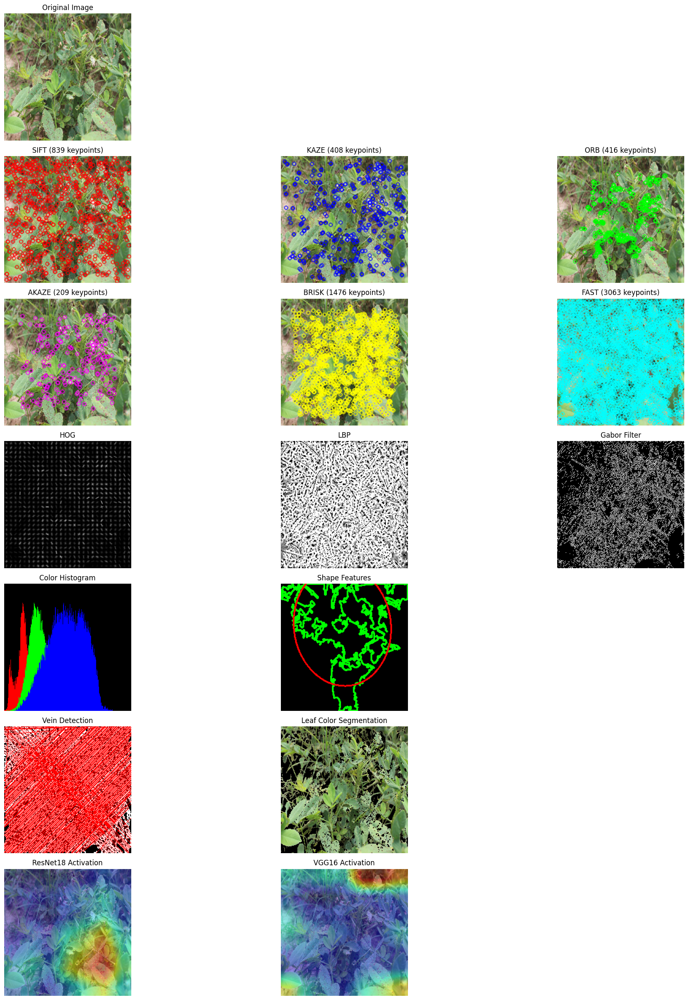

In [4]:
# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "/content/IMG_1779.JPG"
    visualize_all_features(image_path, "feature_extraction_visualization_IMG_1779.png")

Image loaded successfully: /content/IMG_1331.JPG


<ipython-input-3-fabc3987e412>:122: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cv2.line(hist_image, (j, 300), (j, 300 - int(hist[j])), color, 1)


Error processing Wavelet Decomposition: module 'mahotas' has no attribute 'wavelets'
Visualization saved to feature_extraction_visualization_IMG_1331.png


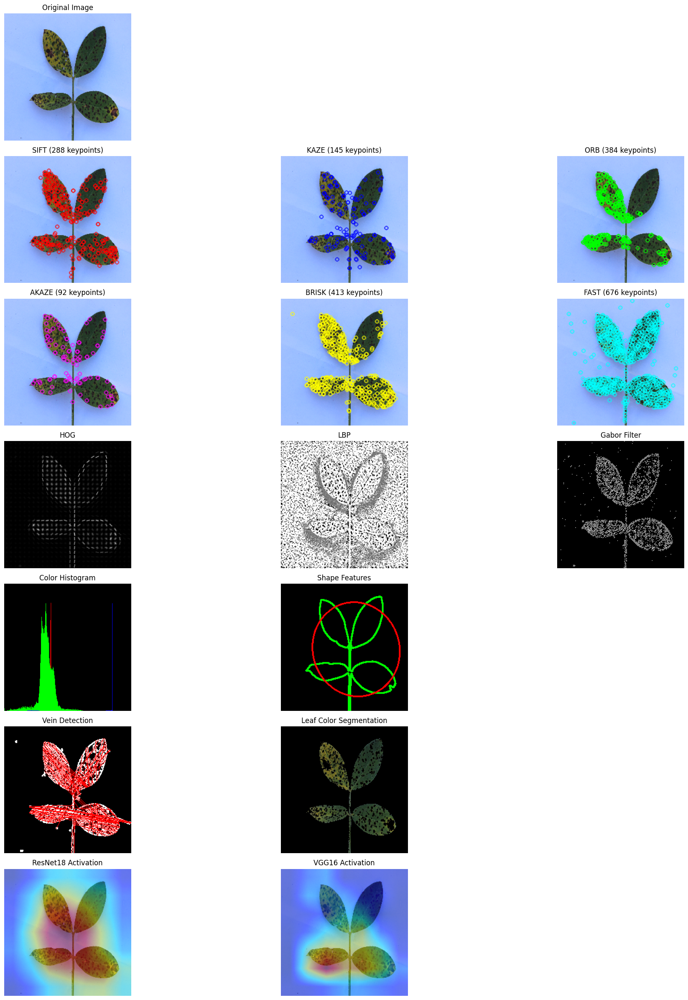

In [5]:
# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "/content/IMG_1331.JPG"
    visualize_all_features(image_path, "feature_extraction_visualization_IMG_1331.png")

Image loaded successfully: /content/DSC00308.JPG


<ipython-input-3-fabc3987e412>:122: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cv2.line(hist_image, (j, 300), (j, 300 - int(hist[j])), color, 1)


Error processing Wavelet Decomposition: module 'mahotas' has no attribute 'wavelets'
Visualization saved to feature_extraction_visualization_DSC00308.png


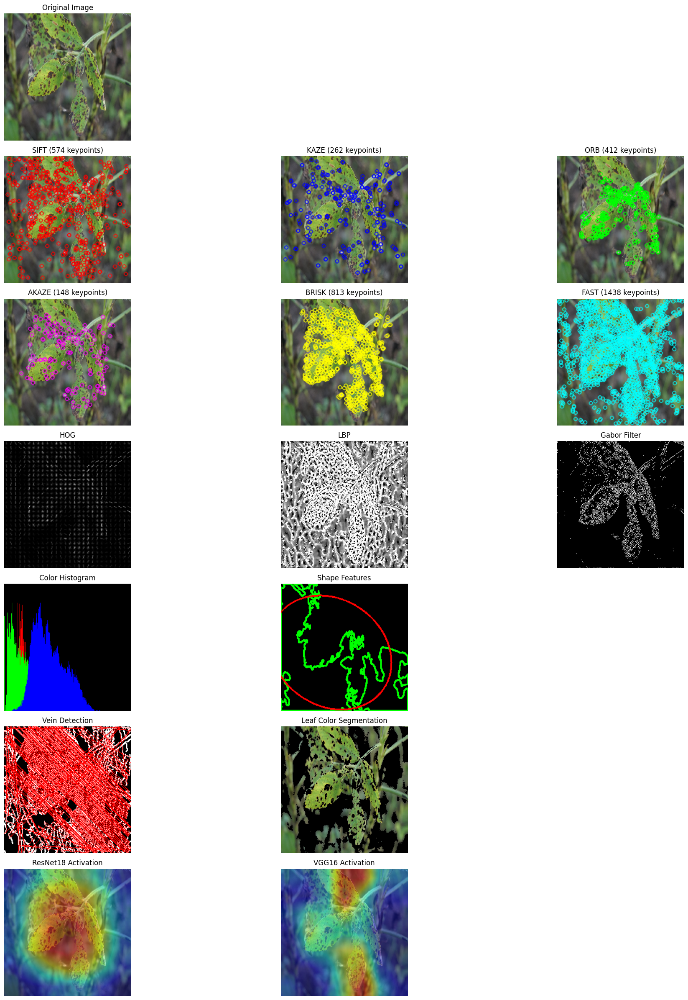

In [6]:
# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "/content/DSC00308.JPG"
    visualize_all_features(image_path, "feature_extraction_visualization_DSC00308.png")

In [7]:
!pip install pywavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 51.5 MB/s eta 0:00:00


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import os
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from skimage import feature, filters, exposure
from scipy import ndimage as ndi
try:
    import mahotas as mt
    HAS_MAHOTAS = True
except ImportError:
    HAS_MAHOTAS = False
    print("Mahotas not installed. Some features will be disabled.")

# Function to load an image
def load_image(image_path, img_size=(224, 224)):
    """Loads and resizes an image."""
    if os.path.exists(image_path):
        img = cv2.imread(image_path)
        if img is None:
            raise ValueError(f"Could not read image at {image_path}")
        img_resized = cv2.resize(img, img_size)
        return img_resized
    else:
        raise FileNotFoundError(f"Image file not found: {image_path}")

# KEYPOINT-BASED METHODS

def extract_sift_features(image):
    """Extract SIFT features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_kaze_features(image):
    """Extract KAZE features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    kaze = cv2.KAZE_create()
    keypoints, descriptors = kaze.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_orb_features(image):
    """Extract ORB features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    orb = cv2.ORB_create()
    keypoints, descriptors = orb.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_akaze_features(image):
    """Extract AKAZE features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    akaze = cv2.AKAZE_create()
    keypoints, descriptors = akaze.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_brisk_features(image):
    """Extract BRISK features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    brisk = cv2.BRISK_create()
    keypoints, descriptors = brisk.detectAndCompute(gray, None)
    return keypoints, descriptors

def extract_fast_features(image):
    """Extract FAST corner features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    fast = cv2.FastFeatureDetector_create()
    keypoints = fast.detect(gray, None)
    return keypoints, None

# REGION-BASED METHODS

def visualize_hog(image):
    """Visualize HOG features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate HOG
    try:
        fd, hog_image = feature.hog(
            gray,
            orientations=8,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            visualize=True,
            feature_vector=True
        )

        # Rescale histogram for better visualization
        hog_image_rescaled = exposure_safe(hog_image)
        return hog_image_rescaled
    except Exception as e:
        print(f"Error in HOG: {e}")
        return np.zeros_like(gray, dtype=np.float32)

def visualize_lbp(image):
    """Visualize LBP features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    radius = 3
    n_points = 8 * radius

    lbp = feature.local_binary_pattern(gray, n_points, radius, method='uniform')

    # Normalize for better visualization
    lbp_normalized = (lbp - lbp.min()) / (lbp.max() - lbp.min())

    return lbp_normalized

def visualize_gabor(image):
    """Visualize Gabor filter responses."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Generate Gabor kernel
    gabor_kernel = filters.gabor_kernel(frequency=0.6, theta=np.pi/4)

    # Apply filter
    filtered_real = ndi.convolve(gray, np.real(gabor_kernel), mode='wrap')

    # Normalize for visualization
    filtered_real = (filtered_real - filtered_real.min()) / (filtered_real.max() - filtered_real.min())

    return filtered_real

def visualize_color_histogram(image):
    """Visualize color histogram as a 3-channel image."""
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create a blank canvas
    hist_image = np.zeros((300, 300, 3), dtype=np.uint8)

    # Draw histograms
    for i, color in enumerate([(0, 0, 255), (0, 255, 0), (255, 0, 0)]):  # BGR
        # Calculate histogram
        hist = cv2.calcHist([hsv], [i], None, [256], [0, 256])
        hist = cv2.normalize(hist, hist, 0, 255, cv2.NORM_MINMAX).flatten()

        # Draw - Fixed the deprecation warning
        for j in range(256):
            val = int(hist[j])  # Extract single element explicitly
            cv2.line(hist_image, (j, 300), (j, 300 - val), color, 1)

    return hist_image

def visualize_shape_features(image):
    """Visualize shape features extraction."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Threshold the image
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a visualization image
    vis_img = np.zeros_like(image)

    if contours:
        # Get the largest contour
        largest_contour = max(contours, key=cv2.contourArea)

        # Draw the contour
        cv2.drawContours(vis_img, [largest_contour], 0, (0, 255, 0), 2)

        # If there are enough points, fit an ellipse
        if len(largest_contour) >= 5:
            ellipse = cv2.fitEllipse(largest_contour)
            cv2.ellipse(vis_img, ellipse, (0, 0, 255), 2)

    return vis_img

# PLANT-SPECIFIC METHODS

def visualize_vein_features(image):
    """Visualize vein extraction features."""
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE for better contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)

    # Edge detection for veins
    edges = cv2.Canny(enhanced, 50, 150)

    # Apply morphological operations
    kernel = np.ones((2, 2), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=1)

    # Create a colored visualization
    vis_img = cv2.cvtColor(dilated, cv2.COLOR_GRAY2BGR)

    # Detect lines (veins)
    lines = cv2.HoughLinesP(dilated, 1, np.pi/180, 50, minLineLength=10, maxLineGap=10)

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(vis_img, (x1, y1), (x2, y2), (0, 0, 255), 1)

    return vis_img

def visualize_leaf_color_features(image):
    """Visualize leaf color segmentation."""
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create masks for green regions
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([100, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    # Apply mask to original image
    green_only = cv2.bitwise_and(image, image, mask=green_mask)

    return green_only

def visualize_texture_wavelet(image):
    """Visualize wavelet decomposition using PyWavelets instead of Mahotas."""
    try:
        import pywt

        # Convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Apply wavelet transform
        coeffs2 = pywt.dwt2(gray, 'haar')
        LL, (LH, HL, HH) = coeffs2

        # Normalize for visualization
        LL_norm = normalize_array(LL)
        LH_norm = normalize_array(LH)
        HL_norm = normalize_array(HL)
        HH_norm = normalize_array(HH)

        # Create a composite image
        h, w = LL.shape
        composite = np.zeros((h*2, w*2), dtype=np.float32)
        composite[:h, :w] = LL_norm
        composite[:h, w:2*w] = LH_norm
        composite[h:2*h, :w] = HL_norm
        composite[h:2*h, w:2*w] = HH_norm

        return composite

    except ImportError:
        print("PyWavelets not installed. Using placeholder for wavelet visualization.")
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        return gray

# DEEP LEARNING METHODS

def visualize_deep_features(image, model_name="resnet18"):
    """Visualize activation maps from a deep learning model."""
    try:
        # Convert to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        pil_image = Image.fromarray(image_rgb)

        # Prepare image for model
        preprocess = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        img_tensor = preprocess(pil_image)
        img_tensor = img_tensor.unsqueeze(0)  # Add batch dimension

        # Load model
        if model_name == "resnet18":
            model = models.resnet18(pretrained=True)
            target_layer = model.layer4[-1]
        elif model_name == "vgg16":
            model = models.vgg16(pretrained=True)
            target_layer = model.features[-1]
        else:  # Default to resnet
            model = models.resnet18(pretrained=True)
            target_layer = model.layer4[-1]

        model.eval()

        # Extract intermediate activations
        activations = []

        def hook_fn(module, input, output):
            activations.append(output.detach())

        handle = target_layer.register_forward_hook(hook_fn)

        with torch.no_grad():
            model(img_tensor)

        handle.remove()

        # Get activation map
        activation = activations[0].squeeze()

        # Average across channels for visualization
        if len(activation.shape) == 3:
            activation_map = torch.mean(activation, dim=0).numpy()
        else:
            activation_map = activation.numpy()

        # Normalize and resize
        activation_map = normalize_array(activation_map)
        activation_map = cv2.resize(activation_map, (image.shape[1], image.shape[0]))

        # Apply colormap for better visualization
        heatmap = cv2.applyColorMap((activation_map * 255).astype(np.uint8), cv2.COLORMAP_JET)

        # Overlay on original image
        alpha = 0.6
        overlay = cv2.addWeighted(image, alpha, heatmap, 1-alpha, 0)

        return overlay
    except Exception as e:
        print(f"Error in deep learning visualization ({model_name}): {e}")
        return image.copy()  # Return original image as fallback

# HELPER FUNCTIONS

def exposure_safe(image):
    """Safe version of skimage.exposure.rescale_intensity."""
    img_min, img_max = image.min(), image.max()
    if img_max > img_min:
        return (image - img_min) / (img_max - img_min)
    return np.zeros_like(image)

def normalize_array(arr):
    """Normalize array values to 0-1 range."""
    arr_min, arr_max = arr.min(), arr.max()
    if arr_max > arr_min:
        return (arr - arr_min) / (arr_max - arr_min)
    return np.zeros_like(arr)

def draw_keypoints(image, keypoints, color=(0, 255, 0)):
    """Draw keypoints on an image."""
    img_with_kp = cv2.drawKeypoints(image, keypoints, None, color=color)
    return img_with_kp

# MAIN VISUALIZATION FUNCTION

def visualize_all_features(image_path, output_path=None):
    """Visualize all feature extraction methods on one image."""
    # Load the image
    try:
        image = load_image(image_path)
        print(f"Image loaded successfully: {image_path}")
    except Exception as e:
        print(f"Error loading image: {e}")
        return

    # Create figure
    plt.figure(figsize=(20, 24))
    gs = GridSpec(7, 3, figure=plt.gcf())

    # Original image
    ax = plt.subplot(gs[0, 0])
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_title("Original Image")
    ax.axis('off')

    # KEYPOINT METHODS
    keypoint_methods = [
        ("SIFT", extract_sift_features, (0, 0, 255)),
        ("KAZE", extract_kaze_features, (255, 0, 0)),
        ("ORB", extract_orb_features, (0, 255, 0)),
        ("AKAZE", extract_akaze_features, (255, 0, 255)),
        ("BRISK", extract_brisk_features, (0, 255, 255)),
        ("FAST", extract_fast_features, (255, 255, 0))
    ]

    # Process keypoint methods
    for i, (name, method, color) in enumerate(keypoint_methods):
        try:
            row, col = (i // 3) + 1, i % 3
            keypoints, _ = method(image)

            if keypoints is not None:
                img_with_kp = draw_keypoints(image, keypoints, color=color)

                ax = plt.subplot(gs[row, col])
                ax.imshow(cv2.cvtColor(img_with_kp, cv2.COLOR_BGR2RGB))
                ax.set_title(f"{name} ({len(keypoints)} keypoints)")
                ax.axis('off')
            else:
                print(f"No keypoints detected for {name}")
        except Exception as e:
            print(f"Error processing {name}: {e}")

    # REGION-BASED METHODS
    region_methods = [
        ("HOG", visualize_hog, 'gray'),
        ("LBP", visualize_lbp, 'gray'),
        ("Gabor Filter", visualize_gabor, 'gray'),
        ("Color Histogram", visualize_color_histogram, None),
        ("Shape Features", visualize_shape_features, None)
    ]

    # Process region methods
    for i, (name, method, cmap) in enumerate(region_methods):
        try:
            row, col = (i // 3) + 3, i % 3
            result = method(image)

            ax = plt.subplot(gs[row, col])
            if cmap:
                ax.imshow(result, cmap=cmap)
            else:
                ax.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            ax.set_title(name)
            ax.axis('off')
        except Exception as e:
            print(f"Error processing {name}: {e}")

    # PLANT-SPECIFIC METHODS
    plant_methods = [
        ("Vein Detection", visualize_vein_features, None),
        ("Leaf Color Segmentation", visualize_leaf_color_features, None),
        ("Wavelet Decomposition", visualize_texture_wavelet, 'viridis')
    ]

    # Process plant methods
    for i, (name, method, cmap) in enumerate(plant_methods):
        try:
            row, col = 5, i
            result = method(image)

            ax = plt.subplot(gs[row, col])
            if cmap:
                ax.imshow(result, cmap=cmap)
            else:
                ax.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            ax.set_title(name)
            ax.axis('off')
        except Exception as e:
            print(f"Error processing {name}: {e}")

    # DEEP LEARNING METHODS
    deep_methods = [
        ("ResNet18 Activation", lambda img: visualize_deep_features(img, "resnet18"), None),
        ("VGG16 Activation", lambda img: visualize_deep_features(img, "vgg16"), None)
    ]

    # Process deep learning methods
    for i, (name, method, _) in enumerate(deep_methods):
        try:
            row, col = 6, i
            result = method(image)

            ax = plt.subplot(gs[row, col])
            ax.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
            ax.set_title(name)
            ax.axis('off')
        except Exception as e:
            print(f"Error processing {name}: {e}")

    plt.tight_layout()

    if output_path:
        plt.savefig(output_path, bbox_inches='tight', dpi=300)
        print(f"Visualization saved to {output_path}")

    plt.show()

    return True

# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "your_leaf_image.jpg"
    visualize_all_features(image_path, "feature_extraction_visualization.png")

Error loading image: Image file not found: your_leaf_image.jpg


Image loaded successfully: /content/DSC05645.JPG
Visualization saved to feature_extraction_visualization_DSC05645.png


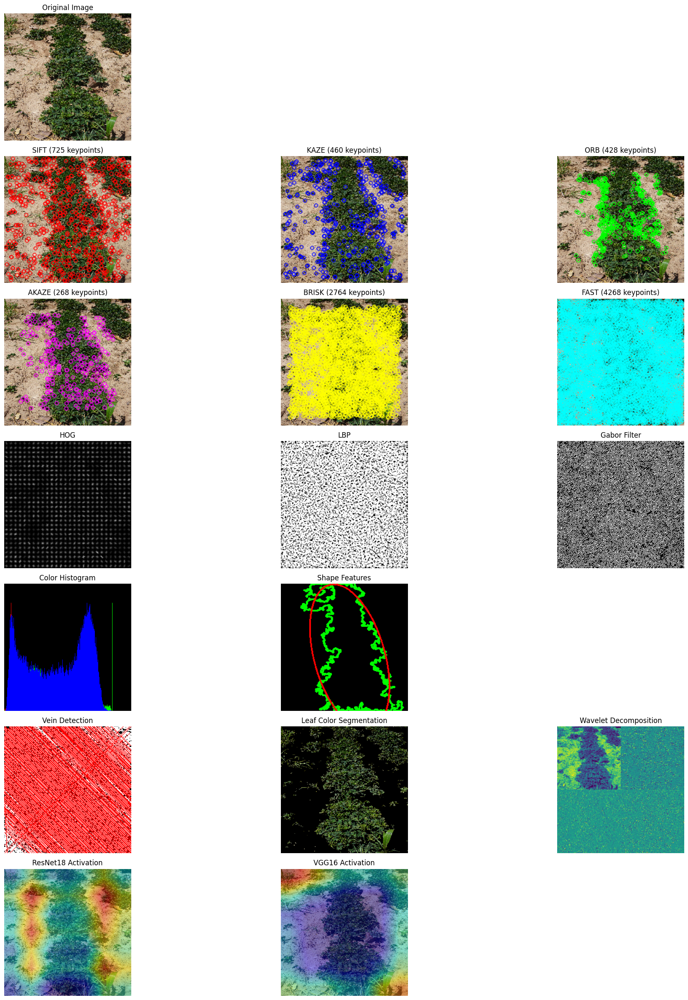

In [9]:
# Example usage
if __name__ == "__main__":
    # Replace with your image path
    image_path = "/content/DSC05645.JPG"
    visualize_all_features(image_path, "feature_extraction_visualization_DSC05645.png")